#Lomonosov Conference 2023
Tensor Decompositions

## Preprocessing

### Importing tensors

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import torch

%matplotlib inline

In [2]:
url_poro = 'https://raw.githubusercontent.com/avanturist322/Tensor-decompositions-in-the-problem-of-approximation-of-geological-objects/main/porosity_spe10.csv'
url_perm = 'https://raw.githubusercontent.com/avanturist322/Tensor-decompositions-in-the-problem-of-approximation-of-geological-objects/main/permeability_spe10.csv'

In [3]:
df = pd.read_csv(url_poro, delimiter=';')
poro_tensor = df.to_numpy()
poro_tensor = np.reshape(poro_tensor, [60, 220, 85])

In [4]:
df2 = pd.read_csv(url_perm, delimiter=';')
good_cols = ['col1', 'col2', 'col3',
             'col4','col5','col6']
perm_tensor = np.array(df2[good_cols])
perm_tensor = np.reshape(perm_tensor, [60, 220, 85])

### Visualization

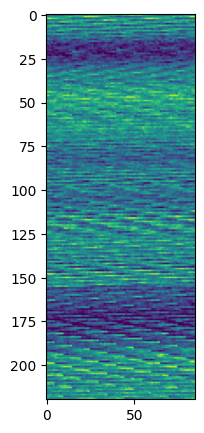

In [5]:
plt.figure(figsize=(10, 5))
plt.imshow(poro_tensor[0, :, :])

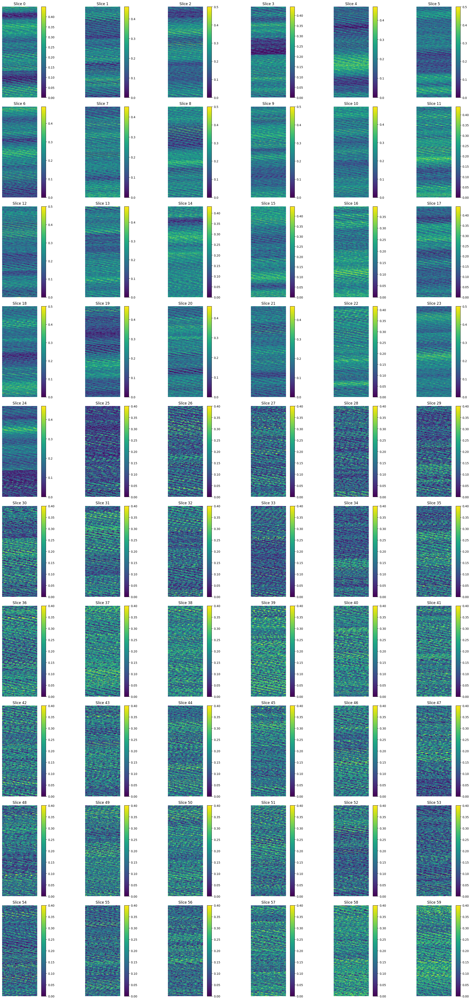

In [6]:
fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(30, 60))
fig.subplots_adjust(hspace=0.1, wspace=0)

for i, ax in enumerate(axes.flat):
    sc = ax.imshow(poro_tensor[i, :, :])
    fig.colorbar(sc, ax=ax)
    ax.set_title('Slice {}'.format(i))
    ax.axis('off')

plt.show()

# Decompositions

## Tensor compression

### Preprocessing

In [7]:
!pip install tntorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
import tntorch as tn
import torch
torch.set_default_dtype(torch.float64)
import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
def numcoef(self):
    """
    Counts the total number of compressed coefficients of this tensor.
    :return: an integer
    """

    result = 0
    for n in range(self.dim()):
        result += self.cores[n].numel()
        if self.Us[n] is not None:
            result += self.Us[n].numel()

    return result

In [10]:
def comp_ratio_mb(real, approx):

    CR = approx.numcoef() * approx.torch().element_size() / (torch.numel(real) * real.element_size())

    return CR

In [11]:
def metrics(real, approx):
    print(approx)
    print('Compression ratio (size): {}'.format(comp_ratio_mb(real, approx)))
    print('Compression ratio (elements): {}/{} = {:g}'.format(approx.numcoef(), real.numel(), approx.numcoef() / real.numel()))
    print('Relative error:', float(tn.relative_error(real, approx)))
    print('RMSE:', float(tn.rmse(real, approx)))
    print('R^2:', float(tn.r_squared(real, approx)))

    pass

In [12]:
def save_tensor(name, tensor):
    np.save(name, tensor.torch().detach().cpu().numpy())

    pass

In [13]:
poro_tensor = torch.from_numpy(poro_tensor)

torch.Size([60, 220, 85])


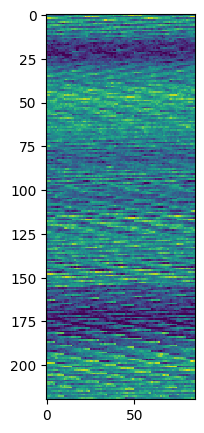

In [14]:
print(poro_tensor.shape)
plt.figure(figsize=(10, 5))
plt.imshow(poro_tensor[0].cpu(), interpolation='none')

### CPD

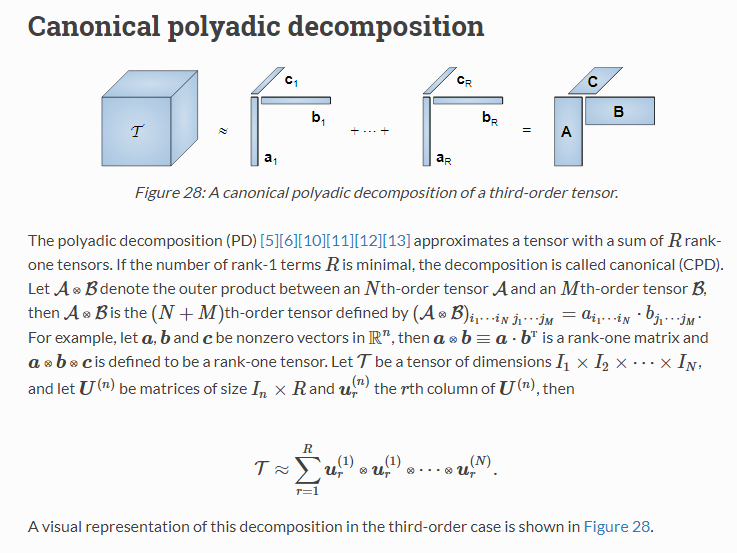

In [15]:
poro_tensor = poro_tensor.to(device)
t = tn.Tensor(poro_tensor, ranks_cp=20, verbose=True, device=device)  # CP is computed using alternating least squares (ALS)
metrics(poro_tensor, t)

ALS -- initialization time = 0.8226563930511475
iter: 0  | eps: 0.44800907 | total time:    0.8366
iter: 1  | eps: 0.43961108 | total time:    0.8501
iter: 2  | eps: 0.41852156 | total time:    0.8634
iter: 3  | eps: 0.40508055 | total time:    0.8768
iter: 4  | eps: 0.40041707 | total time:    0.8902
iter: 5  | eps: 0.39851628 | total time:    0.9036
iter: 6  | eps: 0.39765066 | total time:    0.9171
iter: 7  | eps: 0.39714637 | total time:    0.9305
iter: 8  | eps: 0.39681331 | total time:    0.9440
iter: 9  | eps: 0.39657723 | total time:    0.9574
iter: 10 | eps: 0.39639755 | total time:    0.9707
iter: 11 | eps: 0.39625088 | total time:    0.9841
iter: 12 | eps: 0.39612465 | total time:    0.9975
iter: 13 | eps: 0.39601173 | total time:    1.0080
iter: 14 | eps: 0.39590764 | total time:    1.0155
iter: 15 | eps: 0.39580938 | total time:    1.0232 <- converged (tol=0.0001)
3D CP tensor:

 60  220 85
  |   |   |
 <0> <1> <2>
 / \ / \ / \
20  20  20  20

Compression ratio (size): 0.0

In [16]:
save_tensor('poro_CPD_rank_20', t)

In [17]:
t.numcoef(), t.cores[0].shape[0]*t.cores[0].shape[1] + t.cores[1].shape[0]*t.cores[1].shape[1] + t.cores[2].shape[0]*t.cores[2].shape[1]

(7300, 7300)

In [18]:
t.cores[0].shape,t.cores[1].shape,t.cores[2].shape

(torch.Size([60, 20]), torch.Size([220, 20]), torch.Size([85, 20]))

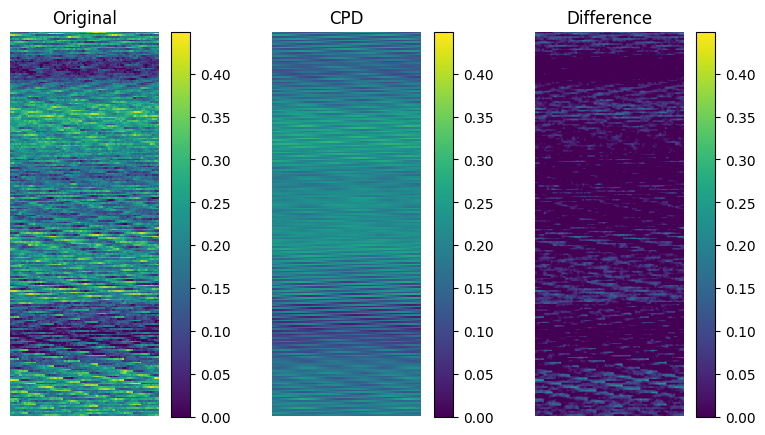

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))
fig.subplots_adjust(wspace=0.05)
vmin = torch.min(poro_tensor[0])
vmax = torch.max(poro_tensor[0])


sc1 = axes[0].imshow(poro_tensor[0].cpu(), interpolation='none', vmin=vmin, vmax=vmax)
fig.colorbar(sc1, ax=axes[0])
axes[0].set_title('Original')
axes[0].axis('off')

sc2 = axes[1].imshow(t.numpy()[0], interpolation='none', vmin=vmin, vmax=vmax)
fig.colorbar(sc2, ax=axes[1])
axes[1].set_title('CPD')
axes[1].axis('off')

sc3 = axes[2].imshow((poro_tensor[0].detach().cpu().numpy() - t.torch().detach().cpu().numpy()[0]), vmin=vmin, vmax=vmax)
fig.colorbar(sc3, ax=axes[2])
axes[2].set_title('Difference')
axes[2].axis('off')

plt.show()

#### CPD Cycle

In [20]:
from tqdm import tqdm
import time

In [21]:
compression_ratio_CPD = []
compression_ratio_CPD_mem = []
relative_error_CPD = []
RMSE_CPD = []
r2_CPD = []
real = poro_tensor
i_mem_CPD = []
t_mem_CPD = []
time_mem_CPD = []
for i in tqdm(np.int32(np.linspace(1, 3075, 50))):#np.logspace(1,3.485,50)
    t_start = time.perf_counter()
    t_CPD = tn.Tensor(poro_tensor, ranks_cp=i, verbose=False, device=device)  # CP is computed using alternating least squares (ALS)
    all_time = time.perf_counter() - t_start
    time_mem_CPD.append(all_time)
    approx_CPD = t_CPD
    compression_ratio_CPD_mem.append(comp_ratio_mb(real, approx_CPD))
    compression_ratio_CPD.append((approx_CPD.numcoef() / real.numel()))
    relative_error_CPD.append(tn.relative_error(real, approx_CPD).cpu())
    RMSE_CPD.append(tn.rmse(real, approx_CPD).cpu())
    r2_CPD.append(tn.r_squared(real, approx_CPD).cpu())
    t_mem_CPD.append(t_CPD)
    i_mem_CPD.append(i / 3075 * 100)
    #save_tensor(f'poro_CPD_rate_{i}', t_CPD)

100%|██████████| 50/50 [08:26<00:00, 10.13s/it]


In [22]:
import zipfile

# Create a new zip file
with zipfile.ZipFile('t_mem_CPD.zip', 'w') as zip_file:
    lst1 = []
    lst2 = []
    for i in range(0, len(i_mem_CPD), 7):
        lst1.append(i_mem_CPD[i])
        lst2.append(t_mem_CPD[i])
    # Add each tensor to the zip file
    for ind, (i, tensor) in enumerate(zip(lst1, lst2)):
        # Convert tensor to numpy array
        tensor_array = tensor.numpy()
        # Save numpy array as binary file
        np.save(f'poro_CPD_rate_{i}.npy', tensor_array)
        # Write binary file to the zip file
        zip_file.write(f'poro_CPD_rate_{i}.npy')

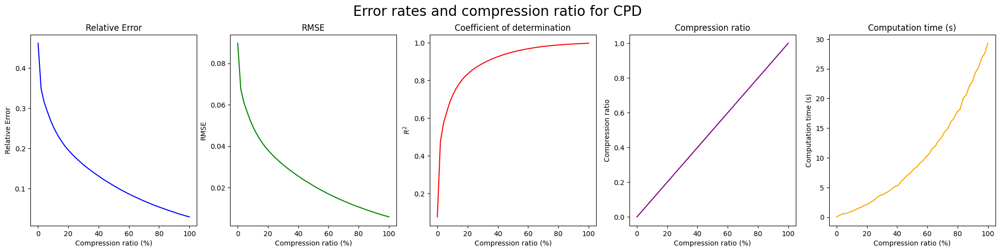

In [23]:
# Set figure size
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot relative error
axs[0].plot(i_mem_CPD, relative_error_CPD, color='blue')
axs[0].set_title('Relative Error')
axs[0].set_xlabel('Compression ratio (%)')
axs[0].set_ylabel('Relative Error')
axs[0].tick_params(axis='both', which='major', labelsize=10)

# Plot RMSE
axs[1].plot(i_mem_CPD, RMSE_CPD, color='green')
axs[1].set_title('RMSE')
axs[1].set_xlabel('Compression ratio (%)')
axs[1].set_ylabel('RMSE')
axs[1].tick_params(axis='both', which='major', labelsize=10)

# Plot R-squared
axs[2].plot(i_mem_CPD, r2_CPD, color='red')
axs[2].set_title('Coefficient of determination')
axs[2].set_xlabel('Compression ratio (%)')
axs[2].set_ylabel('$R^2$')
axs[2].tick_params(axis='both', which='major', labelsize=10)

# Plot compression ratio
axs[3].plot(i_mem_CPD, compression_ratio_CPD_mem, color='purple')
axs[3].set_title('Compression ratio')
axs[3].set_xlabel('Compression ratio (%)')
axs[3].set_ylabel('Compression ratio')
axs[3].tick_params(axis='both', which='major', labelsize=10)

# Plot computation time
axs[4].plot(i_mem_CPD, time_mem_CPD, color='orange')
axs[4].set_title('Computation time (s)')
axs[4].set_xlabel('Compression ratio (%)')
axs[4].set_ylabel('Computation time (s)')
axs[4].tick_params(axis='both', which='major', labelsize=10)

# Set overall title
fig.suptitle('Error rates and compression ratio for CPD', fontsize=20, y=1)

plt.savefig('metrics_CPD.png')
# Display plot
plt.show()

In [24]:
lst1 = []
lst2 = []
for i in range(0, len(i_mem_CPD), 7):
    lst1.append(i_mem_CPD[i])
    lst2.append(t_mem_CPD[i])

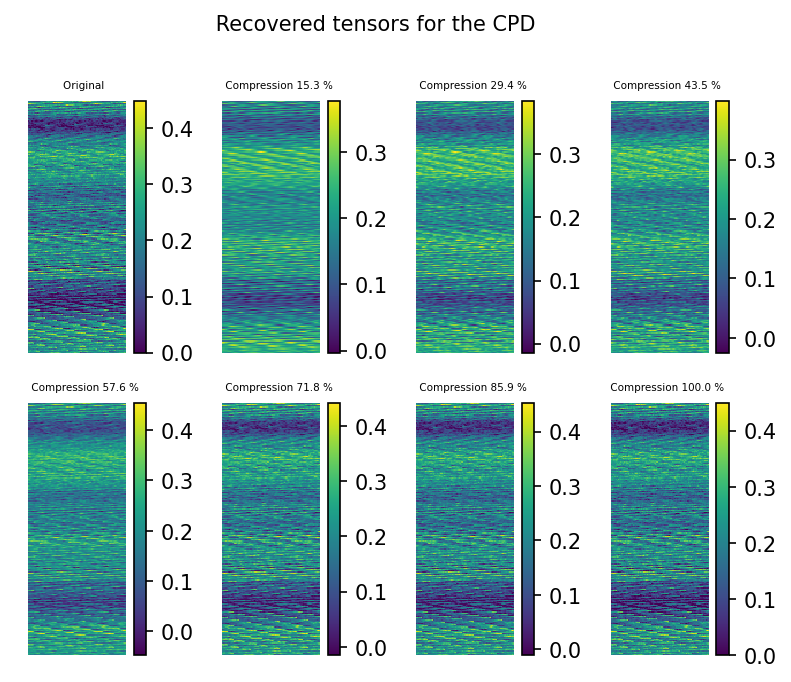

In [61]:
fig, axes = plt.subplots(nrows=2, ncols=4, dpi=150)
# fig.subplots_adjust(hspace = 0, wspace=0.5)

for ind, (i, ax) in enumerate(zip(lst1, axes.flat)):
    if ind == 0:
        sc = ax.imshow(poro_tensor.cpu().numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('    Original', fontsize=5, loc='center')
        ax.axis('off')
        
    else:
        sc = ax.imshow(lst2[ind].numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('     Compression {} %'.format(np.round(i, 1)), fontsize=5, loc='center')
        ax.axis('off')

fig.suptitle('      Recovered tensors for the CPD', fontsize=10, y=1, horizontalalignment='center')

plt.savefig('tensors_CPD.png')

plt.show()

### Tucker

In [26]:
t = tn.Tensor(poro_tensor, ranks_tucker=20, verbose=True, device=device)  # CP is computed using alternating least squares (ALS)
metrics(poro_tensor, t)

3D TT-Tucker tensor:

 60  220 85
  |   |   |
 20  20  20
 (0) (1) (2)
 / \ / \ / \
1   60  20  1

Compression ratio (size): 0.02932263814616756
Compression ratio (elements): 32900/1122000 = 0.0293226
Relative error: 0.3832390740851777
RMSE: 0.07452146597110638
R^2: 0.3622721672434287


In [27]:
t.numcoef(), t.cores[0].shape[0]*t.cores[0].shape[1] + t.cores[1].shape[0]*t.cores[1].shape[1] + t.cores[2].shape[0]*t.cores[2].shape[1]

(32900, 1620)

In [28]:
t.cores[0].shape,t.cores[1].shape,t.cores[2].shape

(torch.Size([1, 20, 60]), torch.Size([60, 20, 20]), torch.Size([20, 20, 1]))

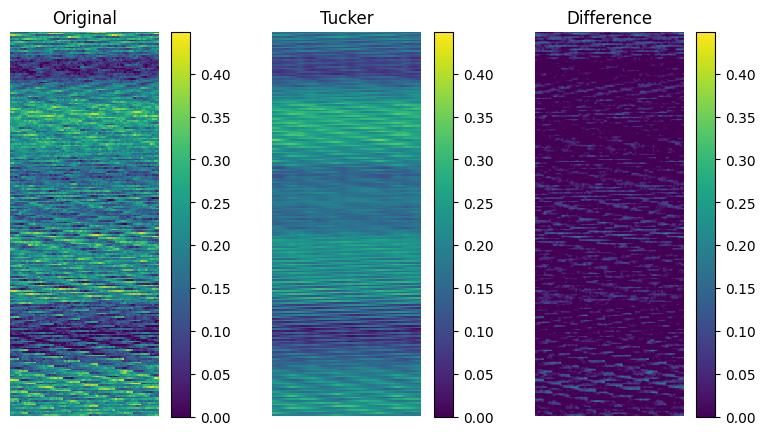

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))
fig.subplots_adjust(wspace=0.05)
vmin = torch.min(poro_tensor[0])
vmax = torch.max(poro_tensor[0])


sc1 = axes[0].imshow(poro_tensor[0].cpu(), interpolation='none', vmin=vmin, vmax=vmax)
fig.colorbar(sc1, ax=axes[0])
axes[0].set_title('Original')
axes[0].axis('off')

sc2 = axes[1].imshow(t.numpy()[0], interpolation='none', vmin=vmin, vmax=vmax)
fig.colorbar(sc2, ax=axes[1])
axes[1].set_title('Tucker')
axes[1].axis('off')

sc3 = axes[2].imshow((poro_tensor[0].detach().cpu().numpy() - t.torch().detach().cpu().numpy()[0]), vmin=vmin, vmax=vmax)
fig.colorbar(sc3, ax=axes[2])
axes[2].set_title('Difference')
axes[2].axis('off')

plt.show()

#### Tucker Cycle

In [30]:
compression_ratio_Tucker = []
compression_ratio_Tucker_mem = []
relative_error_Tucker = []
RMSE_Tucker = []
r2_Tucker = []
real = poro_tensor
i_mem_Tucker = []
t_mem_Tucker = []
time_mem_Tucker = []
for i in tqdm(np.int32(np.linspace(1, 220, 50))):
    t_start = time.perf_counter()
    t_Tucker = tn.Tensor(poro_tensor, ranks_tucker=i, verbose=False, device=device)  # CP is computed using alternating least squares (ALS)
    all_time = time.perf_counter() - t_start
    time_mem_Tucker.append(all_time)
    approx_Tucker = t_Tucker
    compression_ratio_Tucker_mem.append(comp_ratio_mb(real, approx_Tucker))
    compression_ratio_Tucker.append((approx_Tucker.numcoef() / real.numel()))
    relative_error_Tucker.append(tn.relative_error(real, approx_Tucker).cpu())
    RMSE_Tucker.append(tn.rmse(real, approx_Tucker).cpu())
    r2_Tucker.append(tn.r_squared(real, approx_Tucker).cpu())
    t_mem_Tucker.append(t_Tucker)
    i_mem_Tucker.append(i / 220 * 100)
    #save_tensor(f'poro_Tucker_rate_{i}', t_Tucker)

100%|██████████| 50/50 [00:12<00:00,  4.16it/s]


In [31]:
import zipfile

# Create a new zip file
with zipfile.ZipFile('t_mem_Tucker.zip', 'w') as zip_file:
    lst1 = []
    lst2 = []
    for i in range(0, len(i_mem_Tucker), 7):
        lst1.append(i_mem_Tucker[i])
        lst2.append(t_mem_Tucker[i])
    # Add each tensor to the zip file
    for ind, (i, tensor) in enumerate(zip(lst1, lst2)):
        # Convert tensor to numpy array
        tensor_array = tensor.numpy()
        # Save numpy array as binary file
        np.save(f'poro_Tucker_rate_{i}.npy', tensor_array)
        # Write binary file to the zip file
        zip_file.write(f'poro_Tucker_rate_{i}.npy')

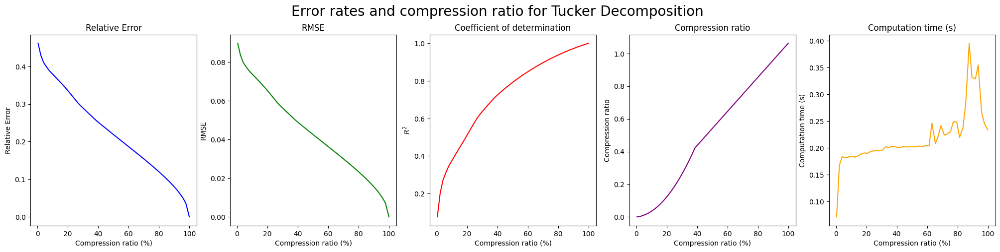

In [32]:
# Set figure size
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot relative error
axs[0].plot(i_mem_Tucker, relative_error_Tucker, color='blue')
axs[0].set_title('Relative Error')
axs[0].set_xlabel('Compression ratio (%)')
axs[0].set_ylabel('Relative Error')
axs[0].tick_params(axis='both', which='major', labelsize=10)

# Plot RMSE
axs[1].plot(i_mem_Tucker, RMSE_Tucker, color='green')
axs[1].set_title('RMSE')
axs[1].set_xlabel('Compression ratio (%)')
axs[1].set_ylabel('RMSE')
axs[1].tick_params(axis='both', which='major', labelsize=10)

# Plot R-squared
axs[2].plot(i_mem_Tucker, r2_Tucker, color='red')
axs[2].set_title('Coefficient of determination')
axs[2].set_xlabel('Compression ratio (%)')
axs[2].set_ylabel('$R^2$')
axs[2].tick_params(axis='both', which='major', labelsize=10)

# Plot compression ratio
axs[3].plot(i_mem_Tucker, compression_ratio_Tucker_mem, color='purple')
axs[3].set_title('Compression ratio')
axs[3].set_xlabel('Compression ratio (%)')
axs[3].set_ylabel('Compression ratio')
axs[3].tick_params(axis='both', which='major', labelsize=10)

# Plot computation time
axs[4].plot(i_mem_Tucker, time_mem_Tucker, color='orange')
axs[4].set_title('Computation time (s)')
axs[4].set_xlabel('Compression ratio (%)')
axs[4].set_ylabel('Computation time (s)')
axs[4].tick_params(axis='both', which='major', labelsize=10)

# Set overall title
fig.suptitle('Error rates and compression ratio for Tucker Decomposition', fontsize=20, y=1)

plt.savefig('metrics_Tucker.png')

# Display plot
plt.show()

In [33]:
lst1 = []
lst2 = []
for i in range(0, len(i_mem_Tucker), 7):
    lst1.append(i_mem_Tucker[i])
    lst2.append(t_mem_Tucker[i])

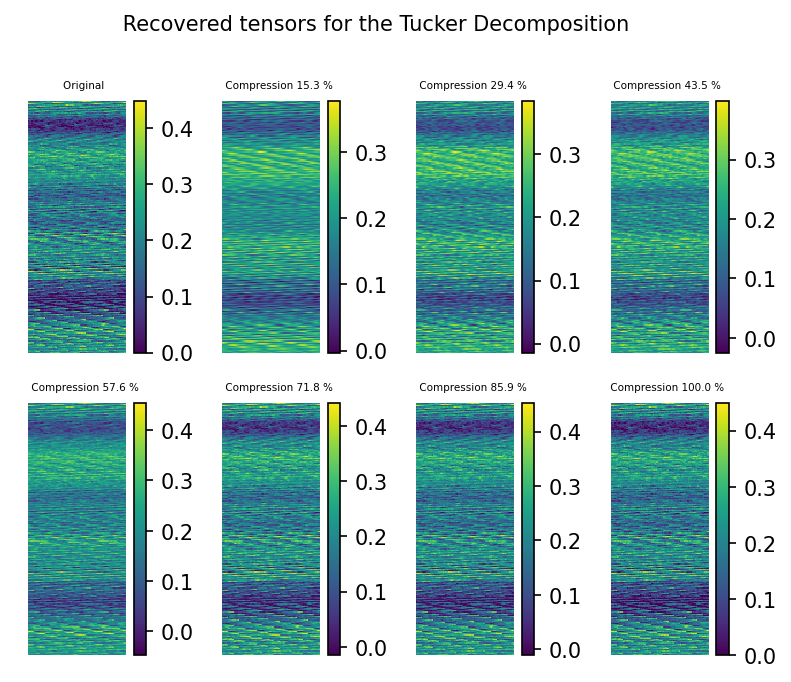

In [62]:
fig, axes = plt.subplots(nrows=2, ncols=4, dpi=150)
# fig.subplots_adjust(hspace = 0, wspace=0.5)

for ind, (i, ax) in enumerate(zip(lst1, axes.flat)):
    if ind == 0:
        sc = ax.imshow(poro_tensor.cpu().numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('    Original', fontsize=5, loc='center')
        ax.axis('off')
    else:
        sc = ax.imshow(lst2[ind].numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('     Compression {} %'.format(np.round(i, 1)), fontsize=5, loc='center')
        ax.axis('off')

fig.suptitle('      Recovered tensors for the Tucker Decomposition', fontsize=10, y=1, horizontalalignment='center')

plt.savefig('tensors_Tucker.png')

plt.show()

### Tensor-Train

In [35]:
t = tn.Tensor(poro_tensor, ranks_tt=20) 
metrics(poro_tensor, t)

3D TT tensor:

 60  220 85
  |   |   |
 (0) (1) (2)
 / \ / \ / \
1   20  20  1

Compression ratio (size): 0.08101604278074866
Compression ratio (elements): 90900/1122000 = 0.081016
Relative error: 0.32897043982724045
RMSE: 0.06396884110944513
R^2: 0.5300955497304152


In [36]:
t.cores[0].shape,t.cores[1].shape,t.cores[2].shape

(torch.Size([1, 60, 20]), torch.Size([20, 220, 20]), torch.Size([20, 85, 1]))

In [37]:
sys.getsizeof(poro_tensor), sys.getsizeof(t)

(72, 48)

#### TT Cycle

In [38]:
perc_list_tt = [1, 3, 5, 10, 15, 25, 50, 80, 85]

In [39]:
compression_ratio_TT = []
compression_ratio_TT_mem = []
relative_error_TT = []
RMSE_TT = []
r2_TT = []
real = poro_tensor
i_mem_TT = []
t_mem_TT = []
time_mem_TT = []
for i in tqdm(np.linspace(1,85,50)):
    t_start = time.perf_counter()
    t_TT = tn.Tensor(poro_tensor, ranks_tt=i, verbose=False, device=device)  # CP is computed using alternating least squares (ALS)
    all_time = time.perf_counter() - t_start
    time_mem_TT.append(all_time)
    approx_TT = t_TT
    compression_ratio_TT_mem.append(comp_ratio_mb(real, approx_TT))
    compression_ratio_TT.append((approx_TT.numcoef() / real.numel()))
    relative_error_TT.append(tn.relative_error(real, approx_TT).cpu())
    RMSE_TT.append(tn.rmse(real, approx_TT).cpu())
    r2_TT.append(tn.r_squared(real, approx_TT).cpu())
    t_mem_TT.append(t_TT)
    i_mem_TT.append(i / 85 * 100)
    #save_tensor(f'poro_TT_rate_{i}', t_TT)

100%|██████████| 50/50 [00:14<00:00,  3.34it/s]


In [40]:
import zipfile

# Create a new zip file
with zipfile.ZipFile('t_mem_TT.zip', 'w') as zip_file:
    lst1 = []
    lst2 = []
    for i in range(0, len(i_mem_TT), 7):
        lst1.append(i_mem_TT[i])
        lst2.append(t_mem_TT[i])
    # Add each tensor to the zip file
    for ind, (i, tensor) in enumerate(zip(lst1, lst2)):
        # Convert tensor to numpy array
        tensor_array = tensor.numpy()
        # Save numpy array as binary file
        np.save(f'poro_TT_rate_{i}.npy', tensor_array)
        # Write binary file to the zip file
        zip_file.write(f'poro_TT_rate_{i}.npy')

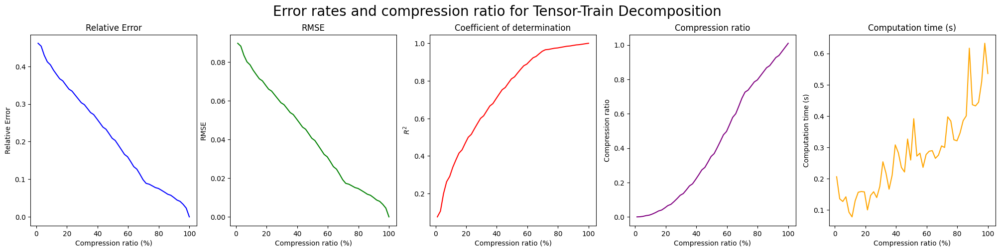

In [41]:
# Set figure size
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot relative error
axs[0].plot(i_mem_TT, relative_error_TT, color='blue')
axs[0].set_title('Relative Error')
axs[0].set_xlabel('Compression ratio (%)')
axs[0].set_ylabel('Relative Error')
axs[0].tick_params(axis='both', which='major', labelsize=10)

# Plot RMSE
axs[1].plot(i_mem_TT, RMSE_TT, color='green')
axs[1].set_title('RMSE')
axs[1].set_xlabel('Compression ratio (%)')
axs[1].set_ylabel('RMSE')
axs[1].tick_params(axis='both', which='major', labelsize=10)

# Plot R-squared
axs[2].plot(i_mem_TT, r2_TT, color='red')
axs[2].set_title('Coefficient of determination')
axs[2].set_xlabel('Compression ratio (%)')
axs[2].set_ylabel('$R^2$')
axs[2].tick_params(axis='both', which='major', labelsize=10)

# Plot compression ratio
axs[3].plot(i_mem_TT, compression_ratio_TT_mem, color='purple')
axs[3].set_title('Compression ratio')
axs[3].set_xlabel('Compression ratio (%)')
axs[3].set_ylabel('Compression ratio')
axs[3].tick_params(axis='both', which='major', labelsize=10)

# Plot computation time
axs[4].plot(i_mem_TT, time_mem_TT, color='orange')
axs[4].set_title('Computation time (s)')
axs[4].set_xlabel('Compression ratio (%)')
axs[4].set_ylabel('Computation time (s)')
axs[4].tick_params(axis='both', which='major', labelsize=10)

# Set overall title
fig.suptitle('Error rates and compression ratio for Tensor-Train Decomposition', fontsize=20, y=1)

plt.savefig('metrics_TT.png')

# Display plot
plt.show()

In [42]:
lst1 = []
lst2 = []
for i in range(0, len(i_mem_TT), 7):
    lst1.append(i_mem_TT[i])
    lst2.append(t_mem_TT[i])

# lst1.append(i_mem_TT[-1])
# lst2.append(t_mem_TT[-1])

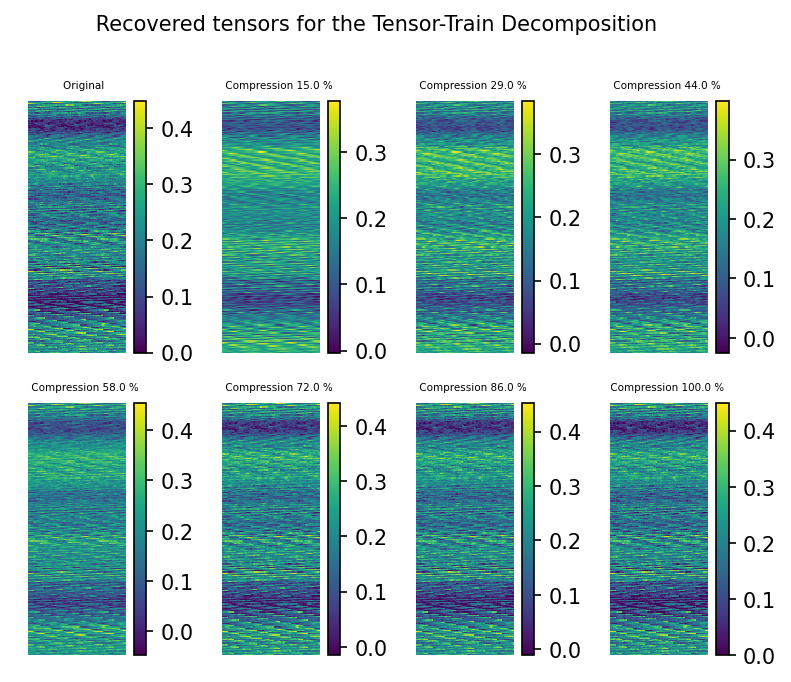

In [63]:
fig, axes = plt.subplots(nrows=2, ncols=4, dpi=150)
# fig.subplots_adjust(hspace = 0, wspace=0.5)

for ind, (i, ax) in enumerate(zip(lst1, axes.flat)):
    if ind == 0:
        sc = ax.imshow(poro_tensor.cpu().numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('    Original', fontsize=5, loc='center')
        ax.axis('off')
    else:
        sc = ax.imshow(lst2[ind].numpy()[0], interpolation='none')
        fig.colorbar(sc, ax=ax)
        ax.set_title('     Compression {} %'.format(np.round(i)), fontsize=5, loc='center')
        ax.axis('off')

fig.suptitle('      Recovered tensors for the Tensor-Train Decomposition', fontsize=10, y=1, horizontalalignment='center')

plt.savefig('tensors_TT.png')

plt.show()

## Comparison

In [44]:
print(RMSE_CPD)
print(RMSE_Tucker)
print(RMSE_TT)

[tensor(0.0897), tensor(0.0676), tensor(0.0611), tensor(0.0568), tensor(0.0527), tensor(0.0492), tensor(0.0463), tensor(0.0437), tensor(0.0415), tensor(0.0395), tensor(0.0378), tensor(0.0361), tensor(0.0346), tensor(0.0333), tensor(0.0319), tensor(0.0307), tensor(0.0295), tensor(0.0283), tensor(0.0272), tensor(0.0262), tensor(0.0252), tensor(0.0241), tensor(0.0232), tensor(0.0223), tensor(0.0214), tensor(0.0204), tensor(0.0196), tensor(0.0188), tensor(0.0180), tensor(0.0172), tensor(0.0165), tensor(0.0158), tensor(0.0151), tensor(0.0144), tensor(0.0137), tensor(0.0131), tensor(0.0125), tensor(0.0118), tensor(0.0112), tensor(0.0107), tensor(0.0102), tensor(0.0096), tensor(0.0091), tensor(0.0086), tensor(0.0081), tensor(0.0076), tensor(0.0071), tensor(0.0067), tensor(0.0062), tensor(0.0058)]
[tensor(0.0897), tensor(0.0835), tensor(0.0798), tensor(0.0771), tensor(0.0752), tensor(0.0734), tensor(0.0719), tensor(0.0700), tensor(0.0685), tensor(0.0665), tensor(0.0649), tensor(0.0627), tensor

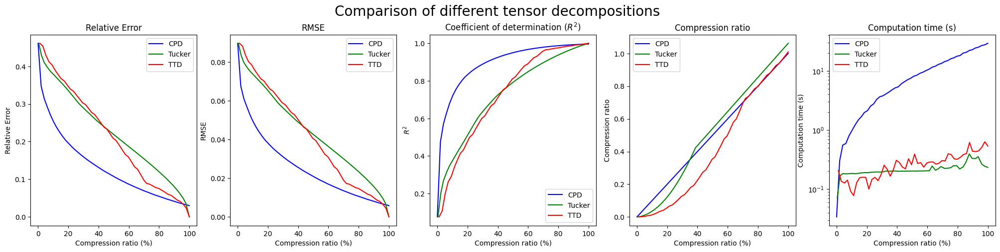

In [45]:
# Create figure and subplots
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

# Plot relative error
axs[0].plot(i_mem_CPD, relative_error_CPD, color='blue')
axs[0].plot(i_mem_Tucker, relative_error_Tucker, color='green')
axs[0].plot(i_mem_TT, relative_error_TT, color='red')
axs[0].set_title('Relative Error')
axs[0].set_xlabel('Compression ratio (%)')
axs[0].set_ylabel('Relative Error')
axs[0].legend(['CPD', 'Tucker', 'TTD'])

# Plot RMSE
axs[1].plot(i_mem_CPD, RMSE_CPD, color='blue')
axs[1].plot(i_mem_Tucker, RMSE_Tucker, color='green')
axs[1].plot(i_mem_TT, RMSE_TT, color='red')
axs[1].set_title('RMSE')
axs[1].set_xlabel('Compression ratio (%)')
axs[1].set_ylabel('RMSE')
# axs[0].set_xscale('log')
axs[1].legend(['CPD', 'Tucker', 'TTD'])

# Plot R-squared
axs[2].plot(i_mem_CPD, r2_CPD, color='blue')
axs[2].plot(i_mem_Tucker, r2_Tucker, color='green')
axs[2].plot(i_mem_TT, r2_TT, color='red')
axs[2].set_title('Coefficient of determination ($R^2$)')
axs[2].set_xlabel('Compression ratio (%)')
axs[2].set_ylabel('$R^2$')
# axs[1].set_xscale('log')
axs[2].legend(['CPD', 'Tucker', 'TTD'])

# Plot compression ratio
axs[3].plot(i_mem_CPD, compression_ratio_CPD, color='blue')
axs[3].plot(i_mem_Tucker, compression_ratio_Tucker, color='green')
axs[3].plot(i_mem_TT, compression_ratio_TT, color='red')
axs[3].set_title('Compression ratio')
axs[3].set_xlabel('Compression ratio (%)')
axs[3].set_ylabel('Compression ratio')
# axs[2].set_xscale('log')
# axs[2].set_yscale('log')
axs[3].legend(['CPD', 'Tucker', 'TTD'])

# Plot computation time
axs[4].plot(i_mem_CPD, time_mem_CPD, color='blue')
axs[4].plot(i_mem_Tucker, time_mem_Tucker, color='green')
axs[4].plot(i_mem_TT, time_mem_TT, color='red')
axs[4].set_title('Computation time (s)')
axs[4].set_xlabel('Compression ratio (%)')
axs[4].set_ylabel('Computation time (s)')
axs[4].set_yscale('log')
axs[4].legend(['CPD', 'Tucker', 'TTD'])

# Set overall title and save figure
fig.suptitle('Comparison of different tensor decompositions', fontsize=20, y=1)

plt.savefig('metrics_all.png')

# Display plot
plt.show()

# Tensor Reconstruction

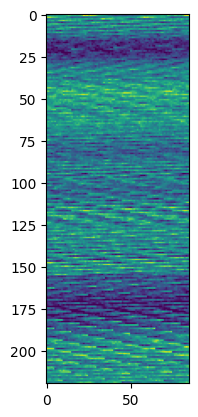

In [46]:
plt.imshow(poro_tensor.cpu()[0, :, :])

In [47]:
poro_tensor.shape

torch.Size([60, 220, 85])

In [48]:
poro_tensor_short = poro_tensor.clone()
start = 105
end = 115
for i in range(poro_tensor.shape[0]):
    poro_tensor_short[i, start:end, 30:40] = 0

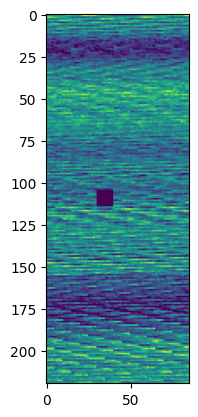

In [49]:
plt.imshow(poro_tensor_short.cpu()[0, :, :])

## Reconstruction

In [50]:
!pip install tensorly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.7/229.7 kB 8.7 MB/s eta 0:00:00


In [51]:
poro_tensor_mask = torch.zeros_like(poro_tensor)
start = 90
end = 140
for i in range(poro_tensor.shape[0]):
    poro_tensor_mask[i, start:end, :] = 1

poro_tensor_mask = 1 - poro_tensor_mask

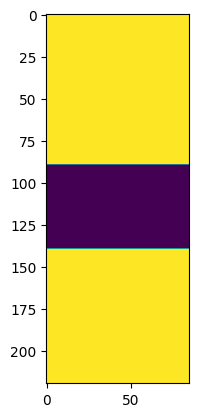

In [52]:
plt.imshow(poro_tensor_mask.cpu()[0, :, :])

In [53]:
import tensorly as tl
import numpy as np

# Входные данные
tensor = poro_tensor.detach().cpu().numpy()  # Исходный трехмерный тензор
# tensor = tensor * (1 - mask)
mask =  poro_tensor_mask.detach().cpu().numpy() # Маска для вырезанной части

# Преобразование тензора в матрицу
unfolded_tensor = tl.unfold(tensor, mode=0)

# Преобразование маски в матрицу
unfolded_mask = tl.unfold(mask, mode=0)
print(unfolded_tensor.shape, unfolded_mask.shape)
# Вычисление Canonical Polyadic Decomposition
rank = 60  # Ранг декомпозиции
cpd = tl.decomposition.parafac(unfolded_tensor, rank=rank, mask=unfolded_mask)

# # CP decomposition
# cpd = tl.decomposition.parafac(tensor, rank=3)

# Восстановление пропущенных данных
weights = cpd.weights
factors = cpd.factors
restored_tensor = tl.kruskal_to_tensor((weights, factors))

# Проверка результата
restored_tensor = restored_tensor.reshape((60, 220, 85))
np.allclose(restored_tensor, tensor)
print(np.linalg.norm(restored_tensor - tensor))

(60, 18700) (60, 18700)
1.1522839682997052e-13


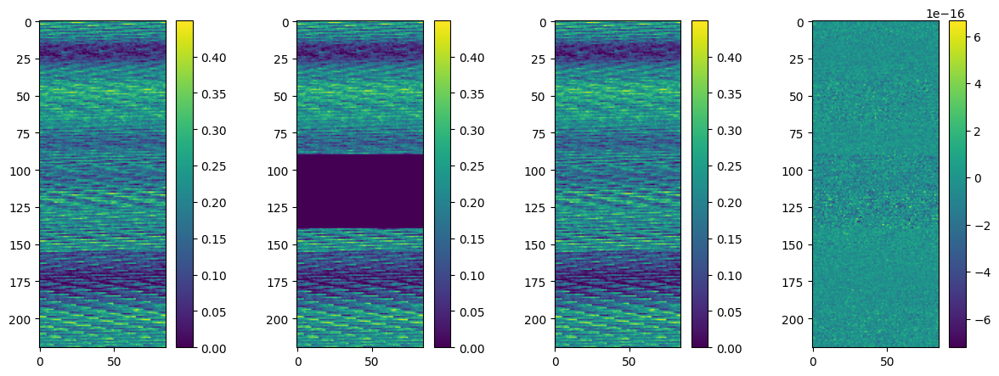

In [54]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# vmin = np.min(tensor)
# vmax = np.max(tensor)

sc1 = axes[0].imshow(tensor[0, :, :])
fig.colorbar(sc1, ax=axes[0])

sc2 = axes[1].imshow((tensor * mask)[0, :, :])
fig.colorbar(sc2, ax=axes[1])

sc3 = axes[2].imshow(restored_tensor[0, :, :])
fig.colorbar(sc3, ax=axes[2])

sc4 = axes[3].imshow((tensor - restored_tensor)[0, :, :])
fig.colorbar(sc4, ax=axes[3])